# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

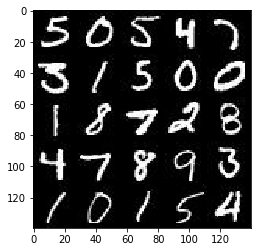

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

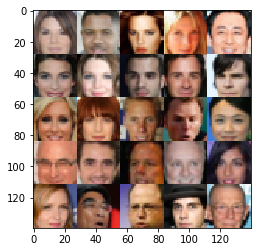

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_dim = (image_width, image_height, image_channels)
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, None, name='learning_rate')

    return inputs_real, inputs_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.2
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse= not is_train):
        alpha=0.2
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim,)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real * 0.9)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    samples, losses = [], []
    steps = 0
    
    num_imgs, img_width, img_height, img_channels = data_shape
    real_size = [img_width, img_height, img_channels]
    
    tf.reset_default_graph()
        
    input_real, input_z, lr = model_inputs(img_width, img_height, img_channels, z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, real_size[2])

    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images * 2

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % 100 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    show_generator_output(sess, 25, input_z, img_channels, data_image_mode)
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.2154... Generator Loss: 0.9704


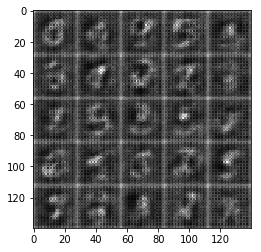

Epoch 1/2... Discriminator Loss: 1.3517... Generator Loss: 0.4052


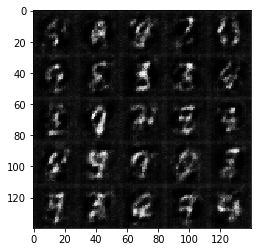

Epoch 1/2... Discriminator Loss: 0.5950... Generator Loss: 1.5685


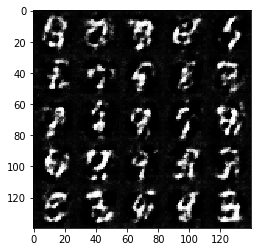

Epoch 1/2... Discriminator Loss: 0.7069... Generator Loss: 1.4526


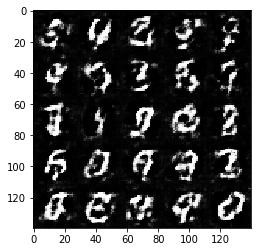

Epoch 1/2... Discriminator Loss: 0.9859... Generator Loss: 0.9204


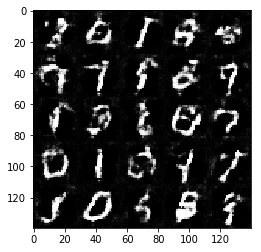

Epoch 1/2... Discriminator Loss: 0.7850... Generator Loss: 1.5685


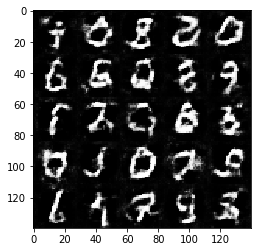

Epoch 1/2... Discriminator Loss: 0.8454... Generator Loss: 0.8880


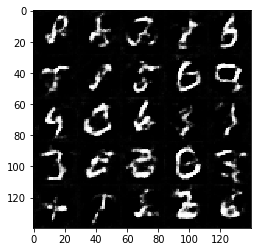

Epoch 1/2... Discriminator Loss: 0.7891... Generator Loss: 0.8205


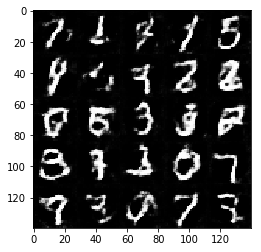

Epoch 1/2... Discriminator Loss: 0.7490... Generator Loss: 0.9300


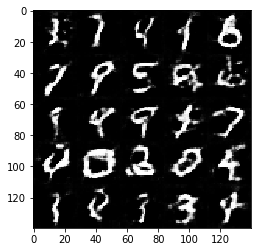

Epoch 1/2... Discriminator Loss: 0.8081... Generator Loss: 1.0012


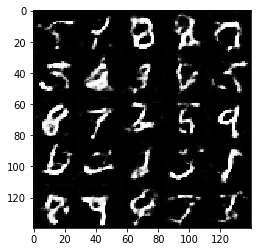

Epoch 1/2... Discriminator Loss: 0.7009... Generator Loss: 1.9606


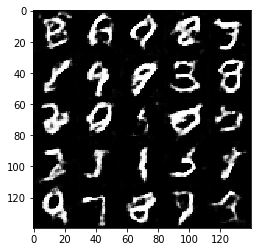

Epoch 1/2... Discriminator Loss: 0.6992... Generator Loss: 1.2775


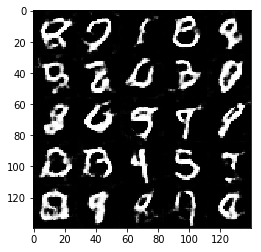

Epoch 1/2... Discriminator Loss: 0.6121... Generator Loss: 1.1047


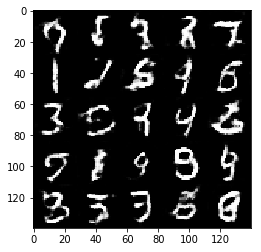

Epoch 1/2... Discriminator Loss: 0.8198... Generator Loss: 0.9934


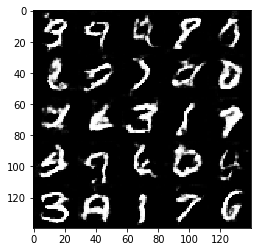

Epoch 1/2... Discriminator Loss: 2.1370... Generator Loss: 0.1644


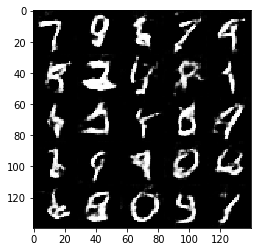

Epoch 1/2... Discriminator Loss: 0.7978... Generator Loss: 2.0592


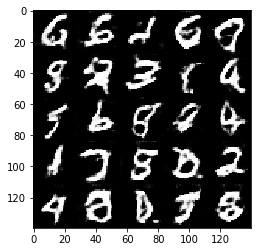

Epoch 1/2... Discriminator Loss: 0.6647... Generator Loss: 0.9492


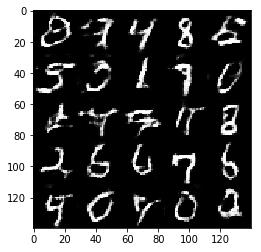

Epoch 1/2... Discriminator Loss: 0.6629... Generator Loss: 1.0650


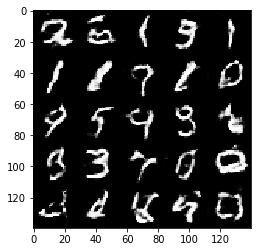

Epoch 2/2... Discriminator Loss: 0.7737... Generator Loss: 0.8670


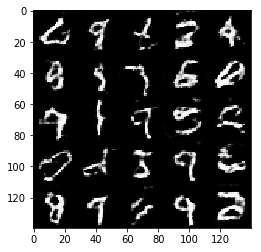

Epoch 2/2... Discriminator Loss: 0.8007... Generator Loss: 0.8469


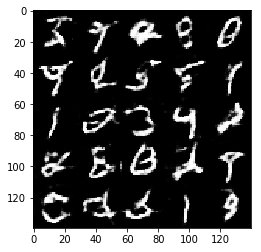

Epoch 2/2... Discriminator Loss: 1.0345... Generator Loss: 0.5690


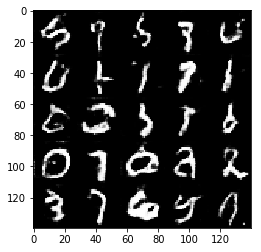

Epoch 2/2... Discriminator Loss: 0.7862... Generator Loss: 0.7900


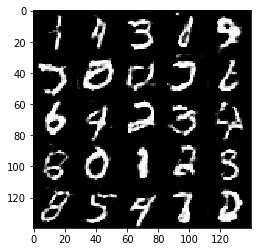

Epoch 2/2... Discriminator Loss: 0.9448... Generator Loss: 0.6946


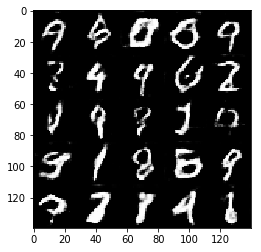

Epoch 2/2... Discriminator Loss: 1.0767... Generator Loss: 0.5946


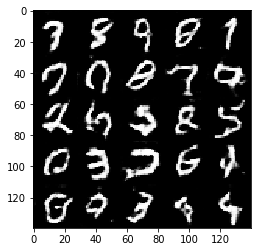

Epoch 2/2... Discriminator Loss: 1.3229... Generator Loss: 0.4687


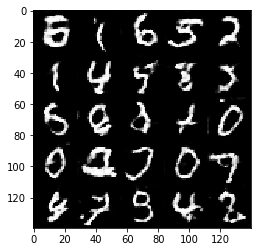

Epoch 2/2... Discriminator Loss: 0.5791... Generator Loss: 1.1461


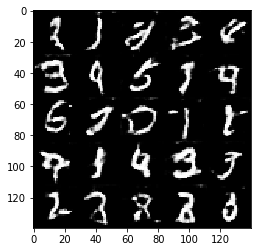

Epoch 2/2... Discriminator Loss: 0.6258... Generator Loss: 0.9621


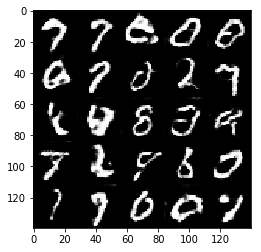

Epoch 2/2... Discriminator Loss: 0.4533... Generator Loss: 1.3776


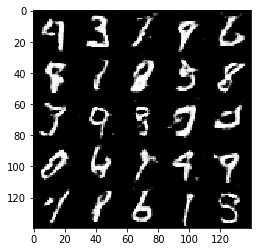

Epoch 2/2... Discriminator Loss: 0.5886... Generator Loss: 1.2290


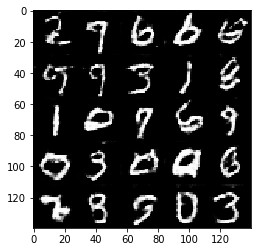

Epoch 2/2... Discriminator Loss: 1.1579... Generator Loss: 0.6154


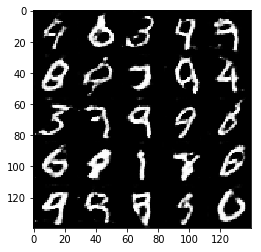

Epoch 2/2... Discriminator Loss: 0.6667... Generator Loss: 0.9914


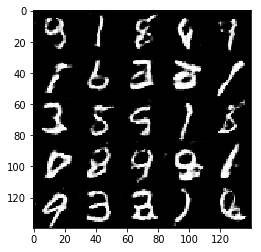

Epoch 2/2... Discriminator Loss: 0.4212... Generator Loss: 1.3505


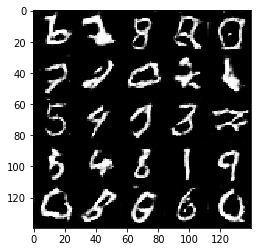

Epoch 2/2... Discriminator Loss: 0.7213... Generator Loss: 0.8222


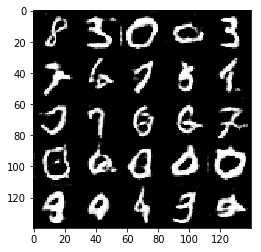

Epoch 2/2... Discriminator Loss: 0.3889... Generator Loss: 1.3609


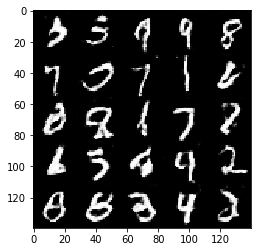

Epoch 2/2... Discriminator Loss: 0.4163... Generator Loss: 1.4296


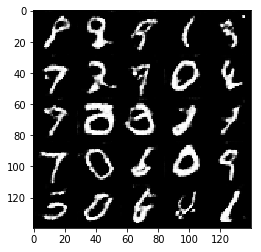

Epoch 2/2... Discriminator Loss: 0.6668... Generator Loss: 0.8849


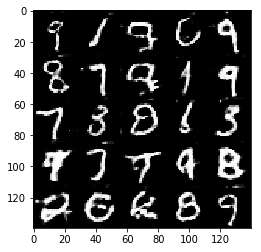

Epoch 2/2... Discriminator Loss: 0.6001... Generator Loss: 1.1311


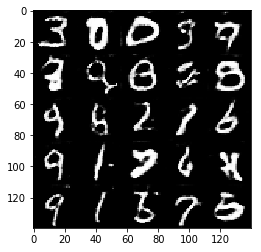

IndexError: list index out of range

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 0.6582


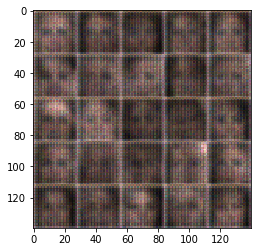

Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 1.3173


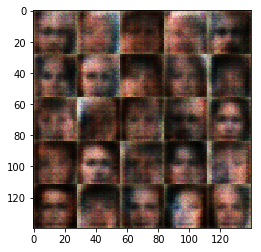

Epoch 1/1... Discriminator Loss: 1.8023... Generator Loss: 0.3103


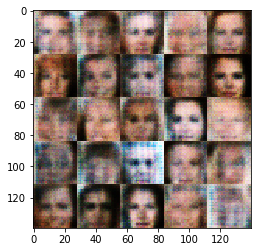

Epoch 1/1... Discriminator Loss: 3.8032... Generator Loss: 0.0265


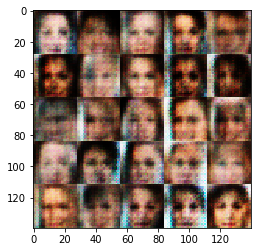

Epoch 1/1... Discriminator Loss: 0.0858... Generator Loss: 3.0462


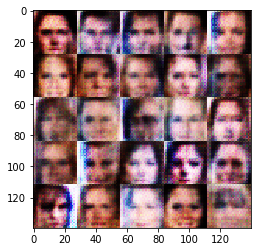

Epoch 1/1... Discriminator Loss: 0.6293... Generator Loss: 8.7145


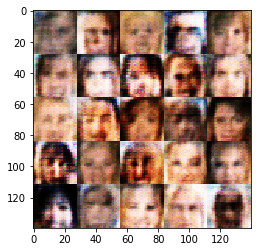

Epoch 1/1... Discriminator Loss: 0.4037... Generator Loss: 1.6327


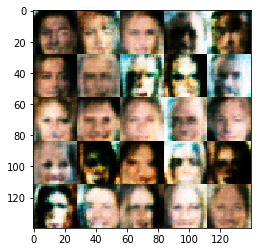

Epoch 1/1... Discriminator Loss: 0.0762... Generator Loss: 7.0147


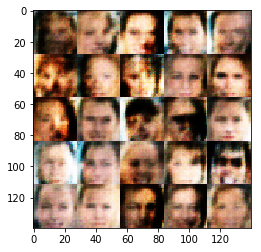

Epoch 1/1... Discriminator Loss: 0.0941... Generator Loss: 9.0158


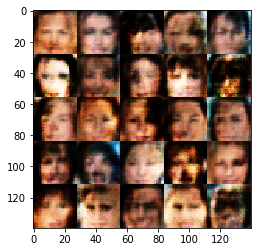

Epoch 1/1... Discriminator Loss: 0.8723... Generator Loss: 0.6754


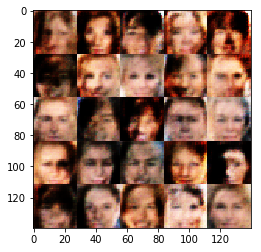

Epoch 1/1... Discriminator Loss: 0.0665... Generator Loss: 4.2029


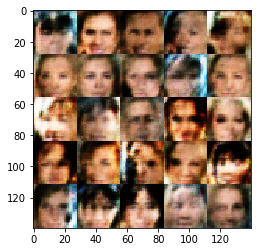

Epoch 1/1... Discriminator Loss: 0.0650... Generator Loss: 4.4621


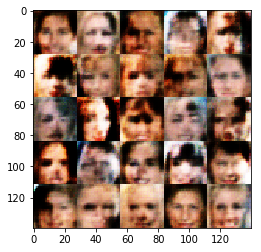

Epoch 1/1... Discriminator Loss: 0.9085... Generator Loss: 0.6806


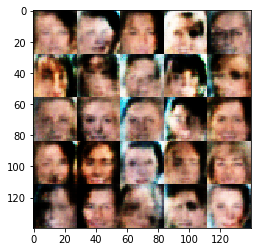

Epoch 1/1... Discriminator Loss: 0.0871... Generator Loss: 8.6965


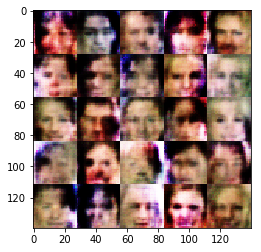

Epoch 1/1... Discriminator Loss: 0.0098... Generator Loss: 6.5895


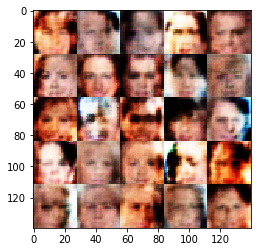

Epoch 1/1... Discriminator Loss: 2.2130... Generator Loss: 0.1930


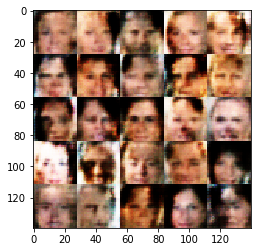

Epoch 1/1... Discriminator Loss: 0.0464... Generator Loss: 4.7012


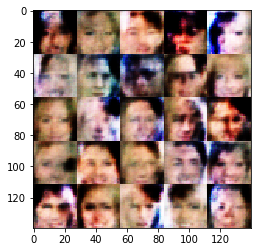

Epoch 1/1... Discriminator Loss: 0.0545... Generator Loss: 6.8799


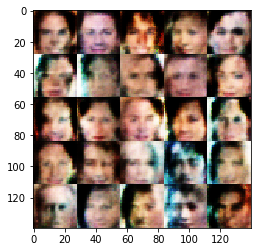

Epoch 1/1... Discriminator Loss: 0.0320... Generator Loss: 6.8000


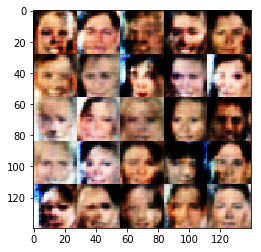

Epoch 1/1... Discriminator Loss: 0.2631... Generator Loss: 1.9911


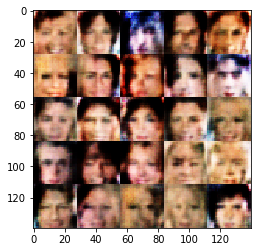

Epoch 1/1... Discriminator Loss: 0.2449... Generator Loss: 1.8871


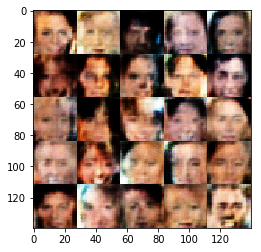

Epoch 1/1... Discriminator Loss: 0.0199... Generator Loss: 6.6993


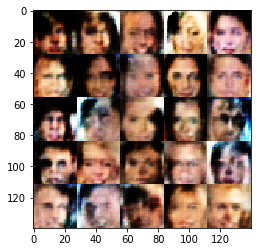

Epoch 1/1... Discriminator Loss: 1.3495... Generator Loss: 0.3641


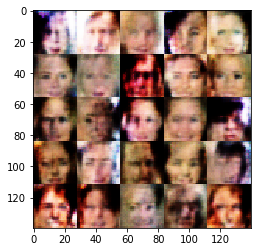

Epoch 1/1... Discriminator Loss: 0.0526... Generator Loss: 3.4531


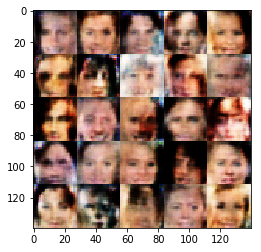

Epoch 1/1... Discriminator Loss: 0.0089... Generator Loss: 10.9945


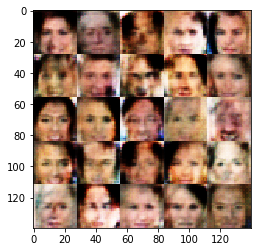

Epoch 1/1... Discriminator Loss: 0.0618... Generator Loss: 4.1530


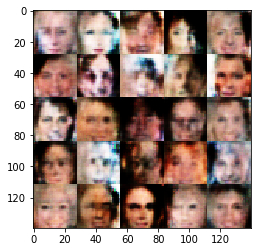

Epoch 1/1... Discriminator Loss: 0.0120... Generator Loss: 6.6739


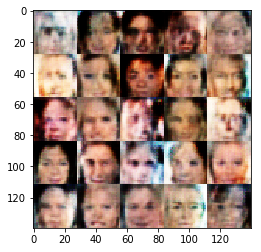

Epoch 1/1... Discriminator Loss: 0.0682... Generator Loss: 4.9467


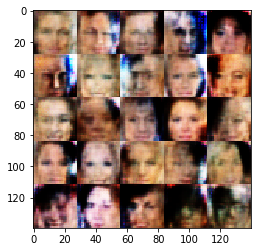

Epoch 1/1... Discriminator Loss: 0.0088... Generator Loss: 10.2763


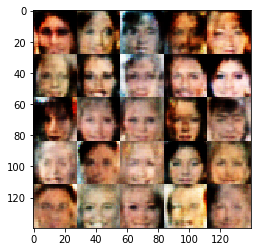

Epoch 1/1... Discriminator Loss: 0.3234... Generator Loss: 1.5852


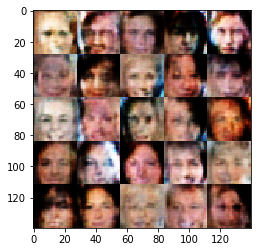

Epoch 1/1... Discriminator Loss: 0.0338... Generator Loss: 4.0422


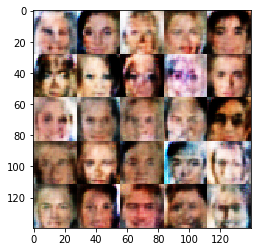

Epoch 1/1... Discriminator Loss: 0.1256... Generator Loss: 4.7396


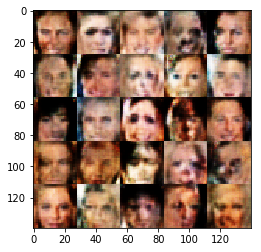

Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 9.3607


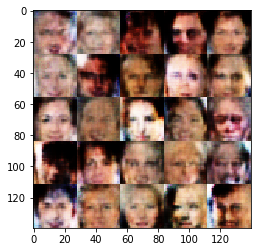

Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 9.1635


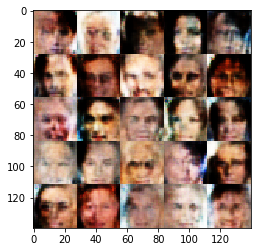

Epoch 1/1... Discriminator Loss: 0.0173... Generator Loss: 6.0861


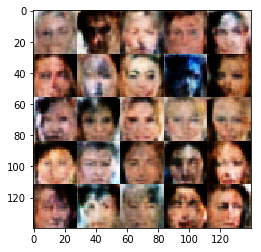

Epoch 1/1... Discriminator Loss: 0.0700... Generator Loss: 3.8146


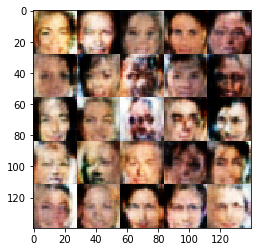

Epoch 1/1... Discriminator Loss: 0.0853... Generator Loss: 5.6693


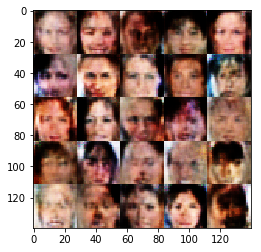

Epoch 1/1... Discriminator Loss: 0.0310... Generator Loss: 5.6020


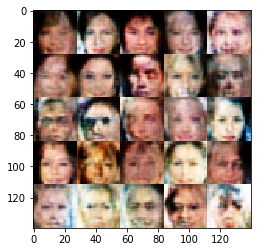

Epoch 1/1... Discriminator Loss: 0.4337... Generator Loss: 1.6041


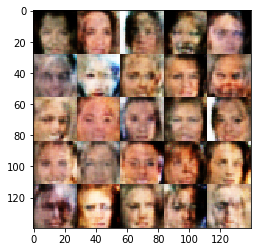

Epoch 1/1... Discriminator Loss: 0.0476... Generator Loss: 3.8139


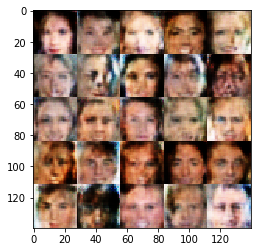

Epoch 1/1... Discriminator Loss: 0.0194... Generator Loss: 8.1957


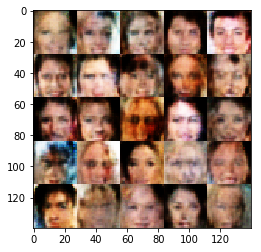

Epoch 1/1... Discriminator Loss: 0.2750... Generator Loss: 1.5555


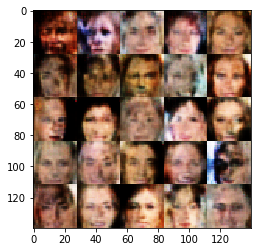

Epoch 1/1... Discriminator Loss: 0.0057... Generator Loss: 7.3647


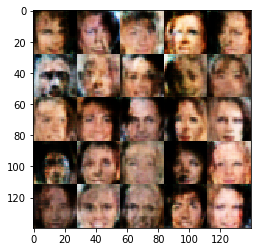

Epoch 1/1... Discriminator Loss: 0.0189... Generator Loss: 7.1752


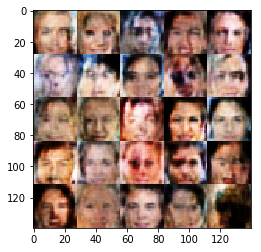

Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 8.3839


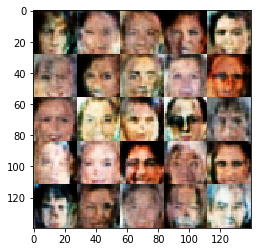

Epoch 1/1... Discriminator Loss: 0.9700... Generator Loss: 0.6042


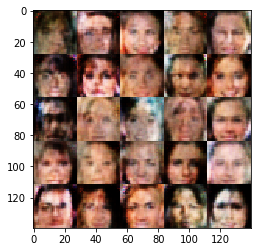

Epoch 1/1... Discriminator Loss: 0.0316... Generator Loss: 4.3776


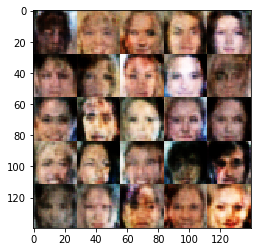

Epoch 1/1... Discriminator Loss: 0.0169... Generator Loss: 5.5063


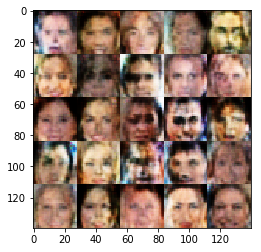

Epoch 1/1... Discriminator Loss: 1.7325... Generator Loss: 0.4331


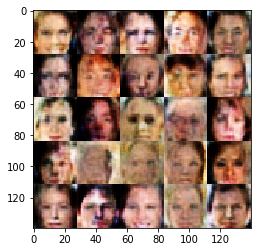

Epoch 1/1... Discriminator Loss: 0.0138... Generator Loss: 7.1412


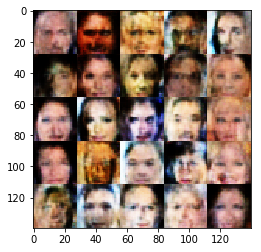

Epoch 1/1... Discriminator Loss: 0.0141... Generator Loss: 10.3343


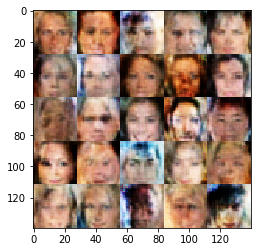

Epoch 1/1... Discriminator Loss: 1.0826... Generator Loss: 3.3892


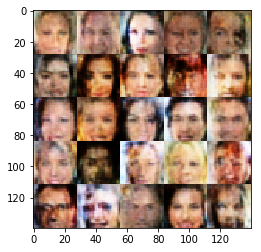

Epoch 1/1... Discriminator Loss: 0.4277... Generator Loss: 1.6895


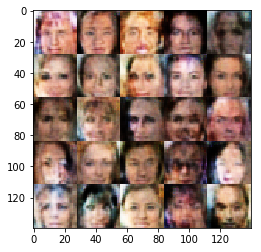

Epoch 1/1... Discriminator Loss: 0.0859... Generator Loss: 5.8352


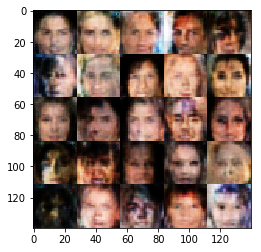

Epoch 1/1... Discriminator Loss: 0.0451... Generator Loss: 5.5974


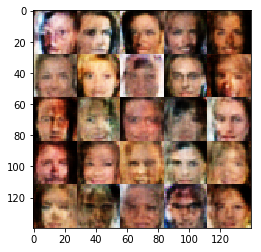

Epoch 1/1... Discriminator Loss: 0.1169... Generator Loss: 3.7746


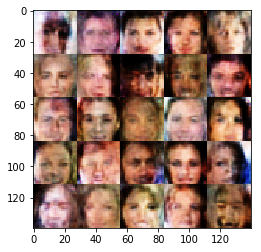

Epoch 1/1... Discriminator Loss: 0.0252... Generator Loss: 6.9900


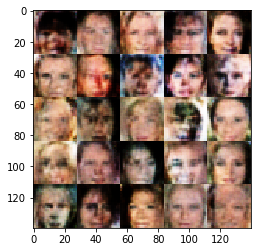

Epoch 1/1... Discriminator Loss: 0.0402... Generator Loss: 5.7631


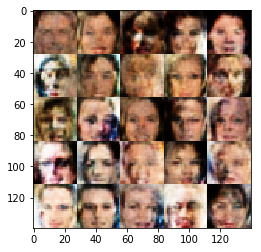

Epoch 1/1... Discriminator Loss: 0.2122... Generator Loss: 2.9627


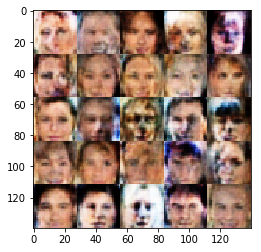

Epoch 1/1... Discriminator Loss: 0.0297... Generator Loss: 4.4816


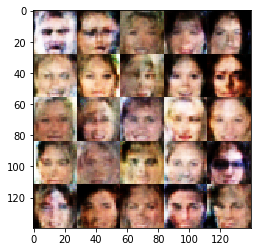

Epoch 1/1... Discriminator Loss: 0.3091... Generator Loss: 1.8340


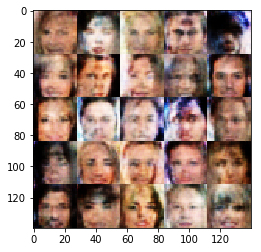

Epoch 1/1... Discriminator Loss: 0.0986... Generator Loss: 2.9590


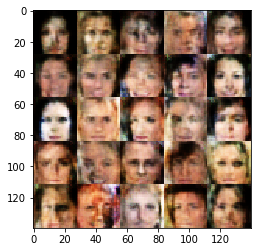

Epoch 1/1... Discriminator Loss: 0.6337... Generator Loss: 1.0925


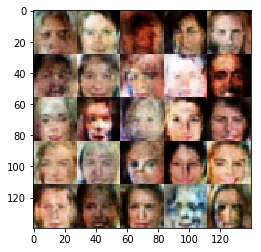

Epoch 1/1... Discriminator Loss: 0.0153... Generator Loss: 7.8427


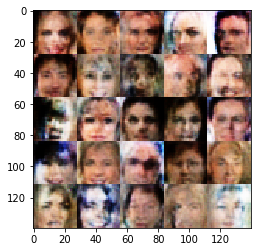

Epoch 1/1... Discriminator Loss: 0.4779... Generator Loss: 1.3098


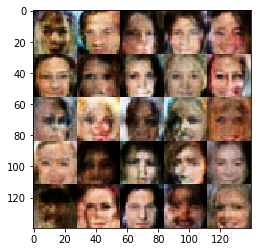

Epoch 1/1... Discriminator Loss: 0.9726... Generator Loss: 4.7168


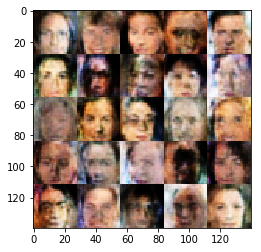

Epoch 1/1... Discriminator Loss: 0.0231... Generator Loss: 4.2866


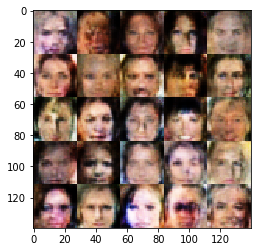

Epoch 1/1... Discriminator Loss: 0.0445... Generator Loss: 9.0846


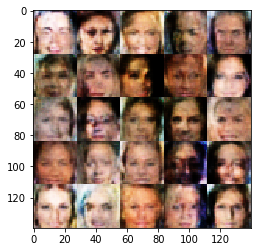

Epoch 1/1... Discriminator Loss: 0.0345... Generator Loss: 3.9859


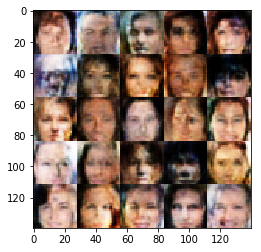

Epoch 1/1... Discriminator Loss: 0.0176... Generator Loss: 5.9968


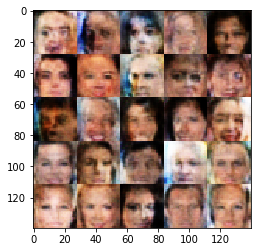

Epoch 1/1... Discriminator Loss: 0.7320... Generator Loss: 1.3110


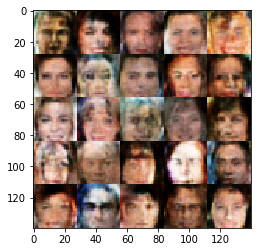

Epoch 1/1... Discriminator Loss: 0.4149... Generator Loss: 3.0509


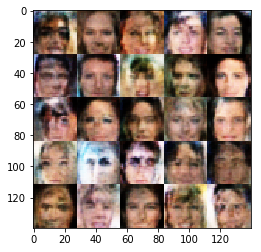

Epoch 1/1... Discriminator Loss: 0.0072... Generator Loss: 6.3854


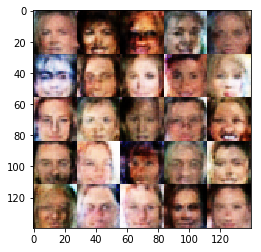

Epoch 1/1... Discriminator Loss: 0.0284... Generator Loss: 5.1508


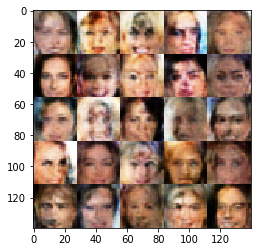

Epoch 1/1... Discriminator Loss: 0.1184... Generator Loss: 6.9858


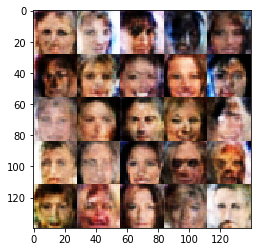

Epoch 1/1... Discriminator Loss: 0.0887... Generator Loss: 3.2628


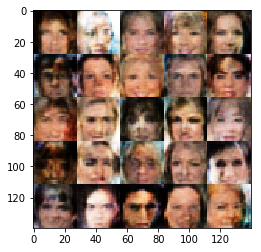

Epoch 1/1... Discriminator Loss: 0.4020... Generator Loss: 1.4490


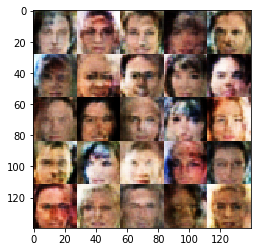

Epoch 1/1... Discriminator Loss: 0.0441... Generator Loss: 3.7988


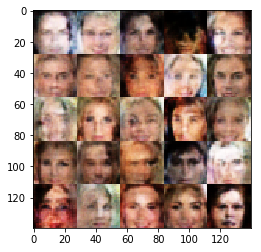

Epoch 1/1... Discriminator Loss: 2.0740... Generator Loss: 4.6725


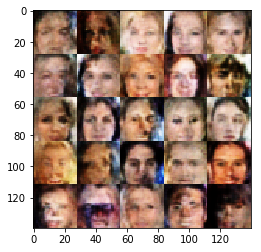

Epoch 1/1... Discriminator Loss: 0.0447... Generator Loss: 4.9571


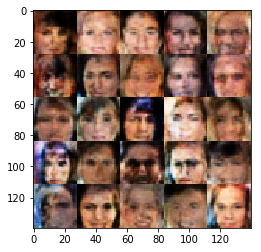

Epoch 1/1... Discriminator Loss: 0.0219... Generator Loss: 7.1337


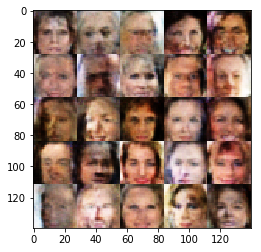

Epoch 1/1... Discriminator Loss: 0.0593... Generator Loss: 3.6979


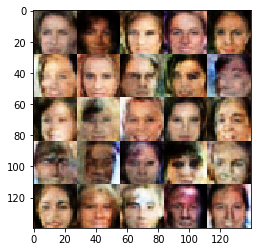

Epoch 1/1... Discriminator Loss: 0.0334... Generator Loss: 8.5397


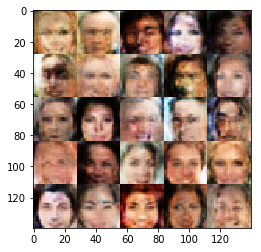

Epoch 1/1... Discriminator Loss: 0.0164... Generator Loss: 6.7375


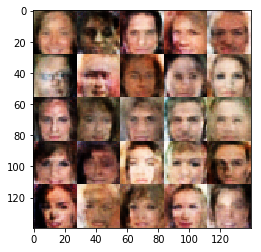

Epoch 1/1... Discriminator Loss: 0.0322... Generator Loss: 8.4452


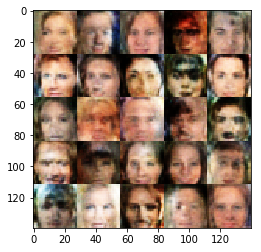

Epoch 1/1... Discriminator Loss: 0.6049... Generator Loss: 1.0068


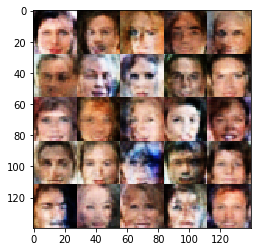

Epoch 1/1... Discriminator Loss: 0.0240... Generator Loss: 4.9569


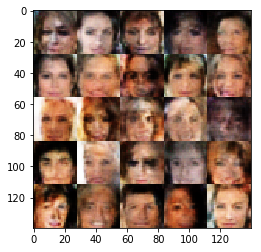

Epoch 1/1... Discriminator Loss: 0.1927... Generator Loss: 6.0730


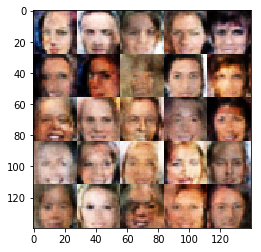

Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 9.2035


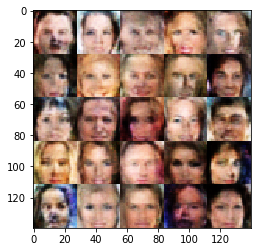

Epoch 1/1... Discriminator Loss: 0.3785... Generator Loss: 2.0931


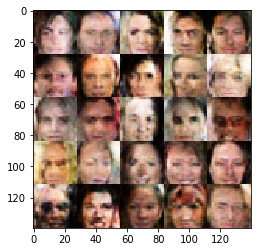

Epoch 1/1... Discriminator Loss: 1.0569... Generator Loss: 0.5725


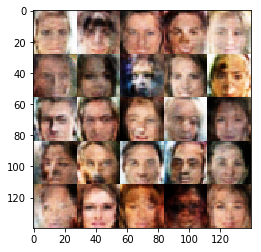

Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 1.7567


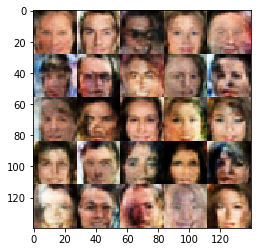

Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 0.4819


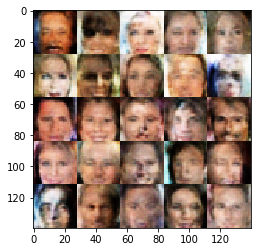

Epoch 1/1... Discriminator Loss: 1.8085... Generator Loss: 0.2446


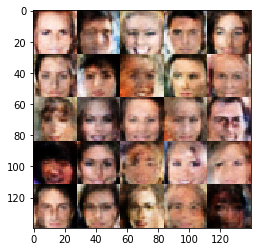

Epoch 1/1... Discriminator Loss: 0.2785... Generator Loss: 1.6934


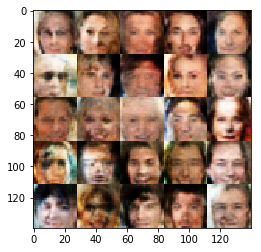

Epoch 1/1... Discriminator Loss: 0.0944... Generator Loss: 3.1413


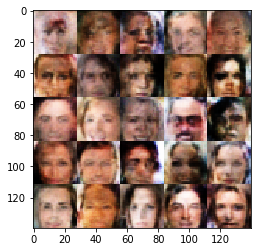

Epoch 1/1... Discriminator Loss: 0.6738... Generator Loss: 1.1657


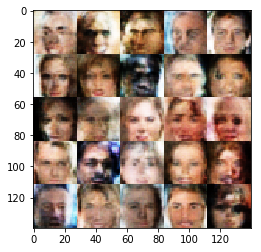

Epoch 1/1... Discriminator Loss: 0.3069... Generator Loss: 1.8500


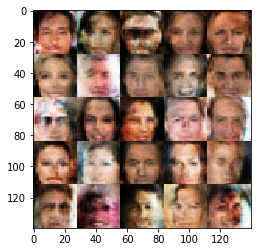

Epoch 1/1... Discriminator Loss: 0.0698... Generator Loss: 3.4071


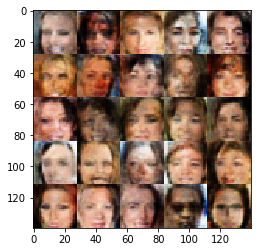

Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 6.4863


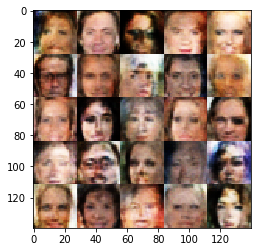

Epoch 1/1... Discriminator Loss: 0.4896... Generator Loss: 1.8758


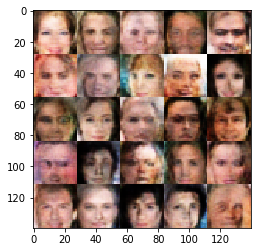

Epoch 1/1... Discriminator Loss: 0.0550... Generator Loss: 8.7826


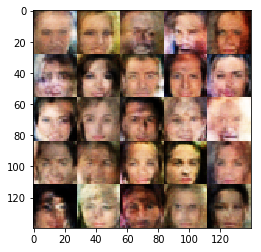

Epoch 1/1... Discriminator Loss: 0.0797... Generator Loss: 3.6052


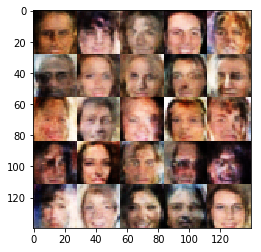

Epoch 1/1... Discriminator Loss: 0.0787... Generator Loss: 5.1907


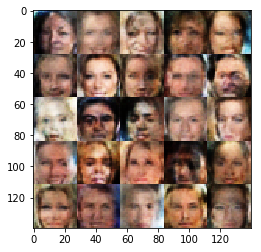

Epoch 1/1... Discriminator Loss: 0.0847... Generator Loss: 3.0918


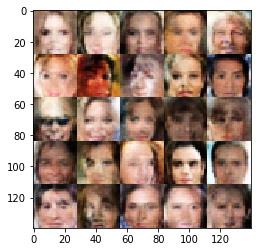

Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.5449


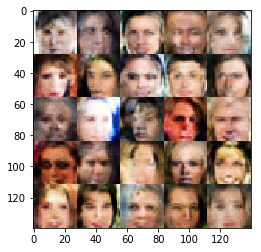

Epoch 1/1... Discriminator Loss: 0.3814... Generator Loss: 2.8953


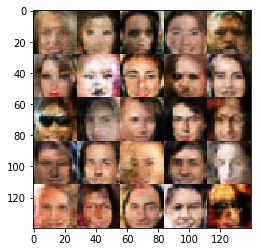

Epoch 1/1... Discriminator Loss: 0.7592... Generator Loss: 1.0318


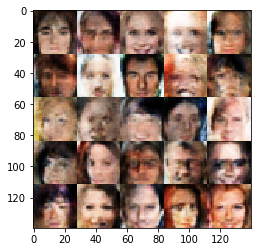

Epoch 1/1... Discriminator Loss: 1.4729... Generator Loss: 0.3321


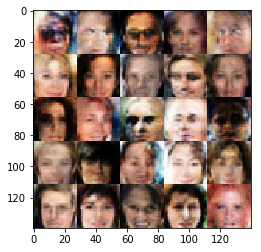

Epoch 1/1... Discriminator Loss: 0.4689... Generator Loss: 1.3245


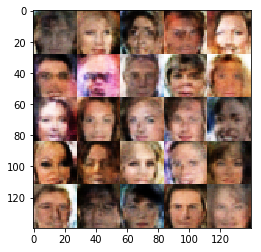

Epoch 1/1... Discriminator Loss: 0.0108... Generator Loss: 5.6089


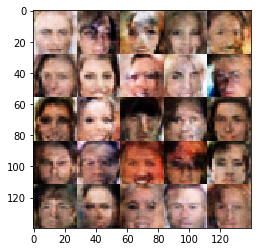

Epoch 1/1... Discriminator Loss: 1.2433... Generator Loss: 0.4767


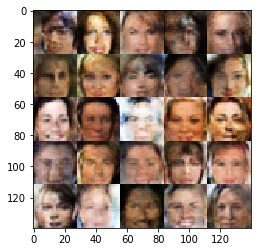

Epoch 1/1... Discriminator Loss: 0.1048... Generator Loss: 2.8595


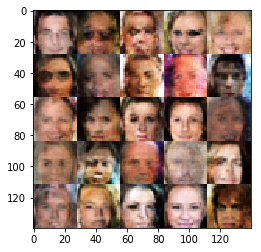

Epoch 1/1... Discriminator Loss: 0.0279... Generator Loss: 7.2869


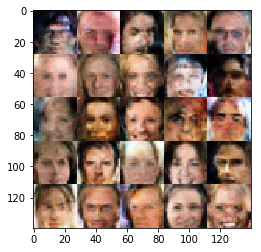

Epoch 1/1... Discriminator Loss: 0.1007... Generator Loss: 3.0220


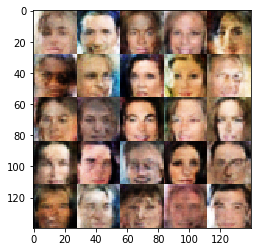

Epoch 1/1... Discriminator Loss: 0.0350... Generator Loss: 4.2588


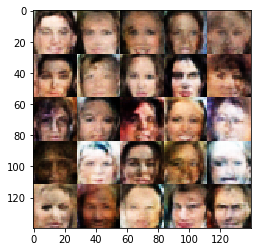

Epoch 1/1... Discriminator Loss: 0.5568... Generator Loss: 3.6122


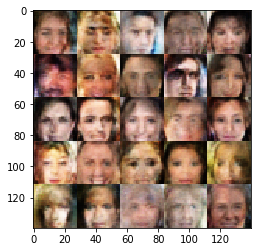

Epoch 1/1... Discriminator Loss: 0.0496... Generator Loss: 5.4704


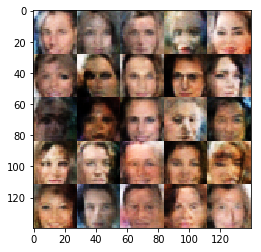

Epoch 1/1... Discriminator Loss: 0.0574... Generator Loss: 3.6058


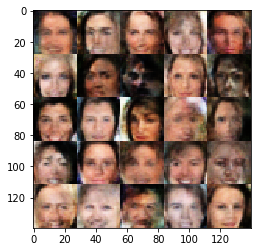

Epoch 1/1... Discriminator Loss: 0.0841... Generator Loss: 3.9737


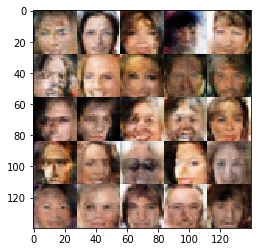

Epoch 1/1... Discriminator Loss: 0.2218... Generator Loss: 1.9192


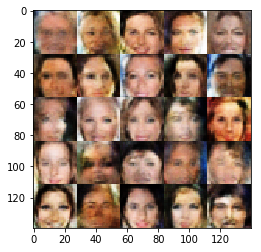

Epoch 1/1... Discriminator Loss: 0.0472... Generator Loss: 5.8837


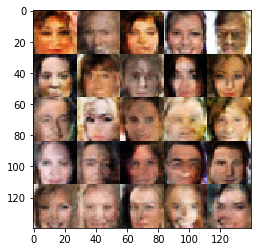

Epoch 1/1... Discriminator Loss: 0.0526... Generator Loss: 3.9179


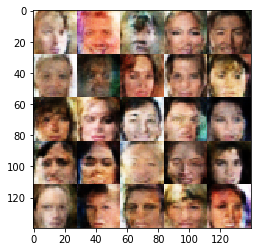

Epoch 1/1... Discriminator Loss: 0.0710... Generator Loss: 3.4661


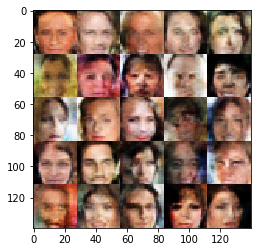

Epoch 1/1... Discriminator Loss: 0.2592... Generator Loss: 2.7657


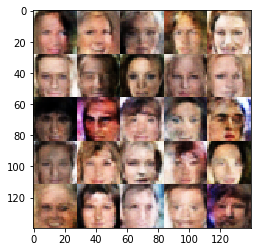

Epoch 1/1... Discriminator Loss: 0.7015... Generator Loss: 0.9263


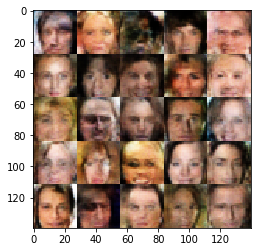

IndexError: list index out of range

In [13]:
batch_size = 16
z_dim = 100
learning_rate =  0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.